In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import os
from os import listdir
from os.path import isfile, join

In [2]:
current_dir = os.path.abspath(os.getcwd())

In [3]:
path = os.path.join(current_dir,'Excel source files')

In [4]:
onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
combined_csv = pd.concat([pd.read_excel(join(path, f)) for f in onlyfiles])

In [5]:
combined_csv.sort_values(by='Data',ascending=True, inplace=True)

In [6]:
combined_csv.rename(columns={'Aleja Krasińskiego - tlenek węgla jednostka ug/m3':'Tlenek1'},inplace=True)

In [7]:
combined_csv['Tlenek1'] = combined_csv['Tlenek1'].fillna(0)

In [8]:
combined_csv.columns = ['Data', 'Tlenek1','Dwutlenek_azotu','Tlenki_azotu','PM10','PM_2_5','Benzen','Tlenek2']

In [9]:
combined_csv['Tlenek2'] = combined_csv['Tlenek2'].fillna(0)

In [10]:
combined_csv['Tlenek_wegla'] = combined_csv['Tlenek1'] + combined_csv['Tlenek2']

In [11]:
combined_csv.drop(columns=['Tlenek1','Tlenek2'], axis=1, inplace=True)

In [12]:
temperatura = pd.read_csv('data_2020_temp.csv')

In [13]:
temperatura.rename(columns={'time': 'Data'},inplace=True)

In [14]:
temperatura['Data'] = pd.to_datetime(temperatura['Data'], format='%Y-%m-%d %H:%M:%S')

In [15]:
combined_csv['Data'] = pd.to_datetime(combined_csv['Data'], format='%Y-%m-%d %H:%M')

In [16]:
smog = combined_csv.merge(temperatura, on='Data', how='left')

In [17]:
smog.columns = ['Data', 'Dwutlenek_azotu','Tlenki_azotu','PM10','PM_2_5','Benzen','Tlenek_wegla','Kierunek_wiatru','Predkosc_wiatru',
               'Temperatura','Wilgotnosc','Cisnienie']

In [18]:
def fill_nan_data(data, column):
    
    spaces = ['', ' ', '  ', '   ']
    indexes = list(data[data[column].isna()].index)
    
    for index in indexes:
        temp = []
        for i in range(len(data)):
        
            if data['Data'].iloc[i].month == data['Data'].iloc[index].month and data['Data'].iloc[i].hour == data['Data'].iloc[index].hour:
                temp.append(data[column].iloc[i])
        
        temp = [float(x) for x in temp if str(x) != 'nan' and str(x) not in spaces]
        mean_ = sum(temp)/len(temp)
        
        data[column].iloc[index] = mean_

In [19]:
def fill_empty_month(data, column):
    
    data1 = []
    data2 = []
    
    for i in range(len(data)):
        if data['Data'][i].month == 8:
            data1.append(data[column][i])
        elif data['Data'][i].month == 11:
            data2.append(data[column][i])
            

    data_month = []

    if len(data1) == len(data2):

        for i in range(len(data1)):
            mean = (data1[i] + data2[i])/2
            data_month.append(mean)

    elif len(data1) < len(data2):

        for i in range(len(data1)):
            mean = (data1[i] + data2[i])/2
            data_month.append(mean)

        data_month.extend(data2[len(data1):])

    else: 

        for i in range(len(data2)):
            mean = (data1[i] + data2[i])/2
            data_month.append(mean)

        data_month.extend(data1[len(data2):])
    
    k = 0   
    for i in range(len(data)):
        if data['Data'].iloc[i].month == 9:
            data[column].iloc[i] = data_month[k]
                
            k += 1

In [20]:
fill_empty_month(smog, 'Kierunek_wiatru')
fill_empty_month(smog, 'Predkosc_wiatru')
fill_empty_month(smog, 'Temperatura')
fill_empty_month(smog, 'Wilgotnosc')
fill_empty_month(smog, 'Cisnienie')

C:\Users\micha\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [21]:
fill_nan_data(smog, 'Dwutlenek_azotu')
fill_nan_data(smog, 'Tlenki_azotu')
fill_nan_data(smog, 'PM10')
fill_nan_data(smog, 'PM_2_5')
fill_nan_data(smog, 'Benzen')
fill_nan_data(smog, 'Tlenek_wegla')
fill_nan_data(smog, 'Kierunek_wiatru')
fill_nan_data(smog, 'Predkosc_wiatru')
fill_nan_data(smog, 'Temperatura')
fill_nan_data(smog, 'Wilgotnosc')
fill_nan_data(smog, 'Cisnienie')

In [22]:
smog['Tlenki_azotu'] = smog['Tlenki_azotu'].fillna(smog['Tlenki_azotu'].rolling(168,min_periods=1).mean())

In [23]:
smog['Dwutlenek_azotu'] = pd.to_numeric(smog.Dwutlenek_azotu, errors='coerce')

In [24]:
smog['PM10'] = pd.to_numeric(smog.PM10, errors='coerce')
smog['Benzen'] = pd.to_numeric(smog.Benzen, errors='coerce')

In [25]:
smog['PM_2_5'] = smog['PM_2_5'].fillna(smog['PM_2_5'].rolling(168,min_periods=1).mean())
smog['Tlenek_wegla'] = smog['Tlenek_wegla'].fillna(smog['Tlenek_wegla'].rolling(168,min_periods=1).mean())
smog['Kierunek_wiatru'] = smog['Kierunek_wiatru'].fillna(smog['Kierunek_wiatru'].rolling(168,min_periods=1).mean())
smog['Predkosc_wiatru'] = smog['Predkosc_wiatru'].fillna(smog['Predkosc_wiatru'].rolling(168,min_periods=1).mean())
smog['Temperatura'] = smog['Temperatura'].fillna(smog['Temperatura'].rolling(168,min_periods=1).mean())
smog['Wilgotnosc'] = smog['Wilgotnosc'].fillna(smog['Wilgotnosc'].rolling(168,min_periods=1).mean())
smog['Cisnienie'] = smog['Cisnienie'].fillna(smog['Cisnienie'].rolling(168,min_periods=1).mean())
smog['Dwutlenek_azotu'] = smog['Dwutlenek_azotu'].fillna(smog['Dwutlenek_azotu'].rolling(168,min_periods=1).mean())
smog['PM10'] = smog['PM10'].fillna(smog['PM10'].rolling(168,min_periods=1).mean())
smog['Benzen'] = smog['Benzen'].fillna(smog['Benzen'].rolling(168,min_periods=1).mean())

In [26]:
smog['Tlenek_wegla'] = smog['Tlenek_wegla'].replace(0, np.nan)
smog['Tlenek_wegla'] = smog['Tlenek_wegla'].fillna(smog['Tlenek_wegla'].rolling(168,min_periods=1).mean())

In [27]:
profile = ProfileReport(smog, title="Krakow smog report")

In [28]:
profile

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
smog.to_excel('Smog.xlsx')

In [30]:
profile.to_file("Smog_data_report_MP.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
import seaborn as sns

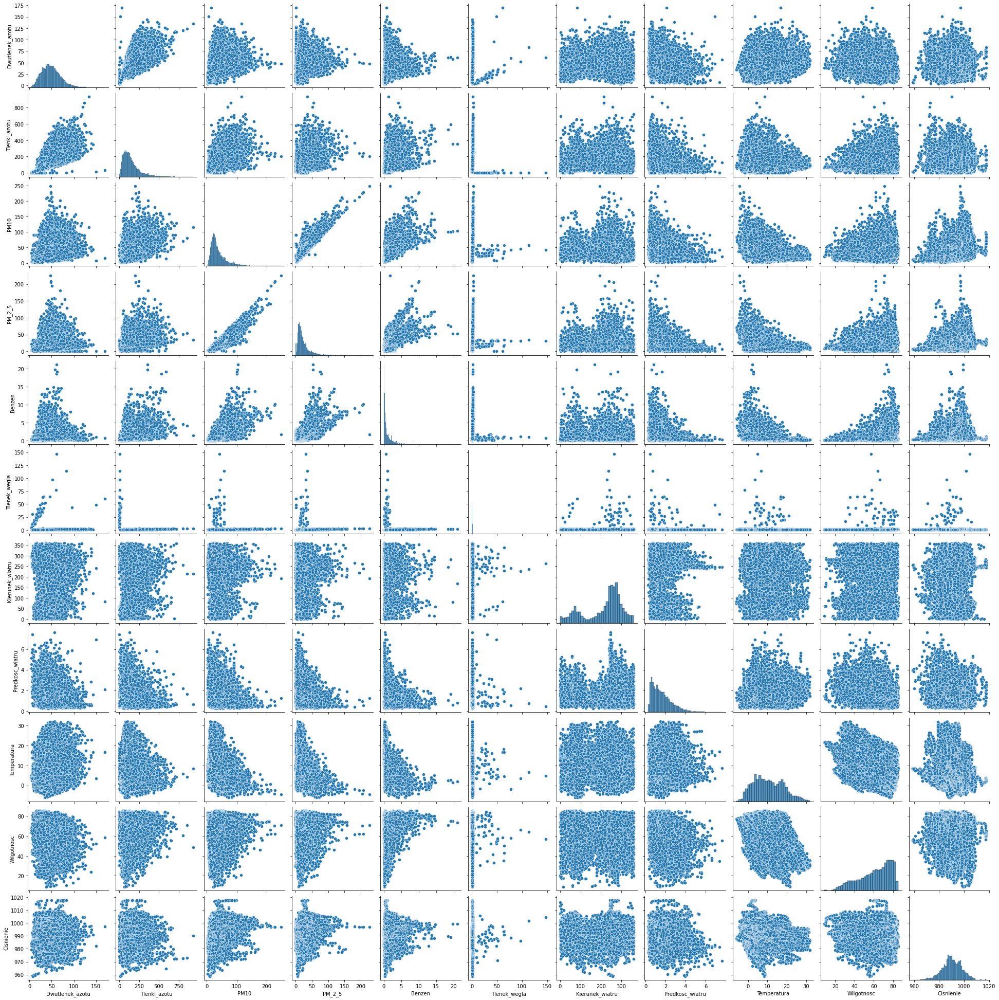

In [32]:
sns.pairplot(smog)

In [33]:
import matplotlib.pyplot as plt

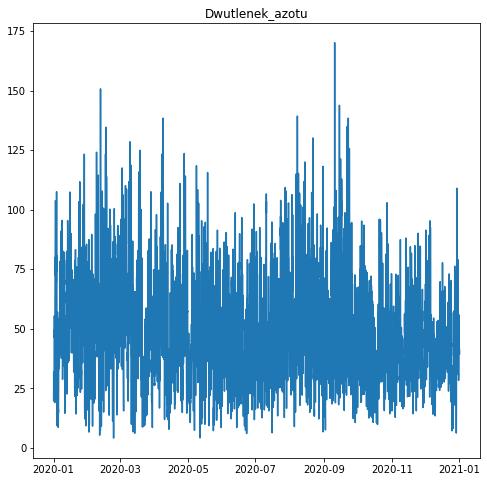

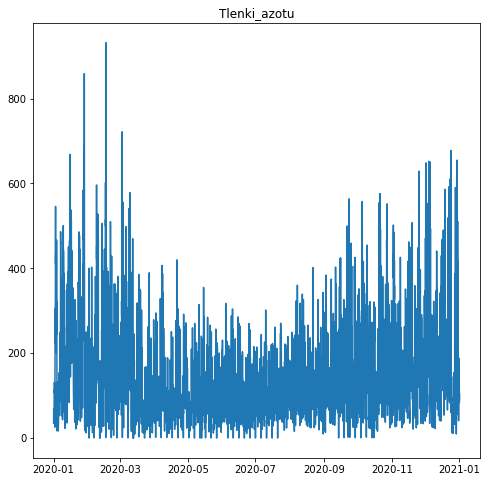

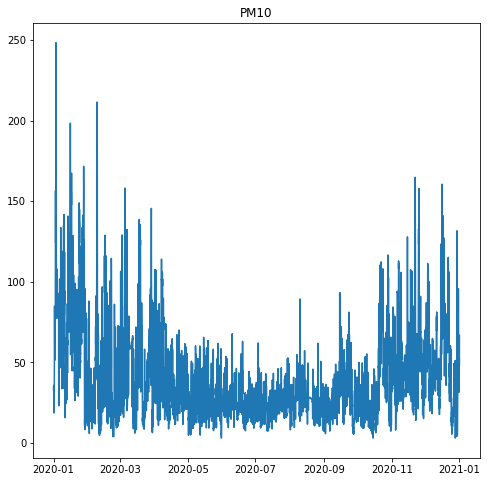

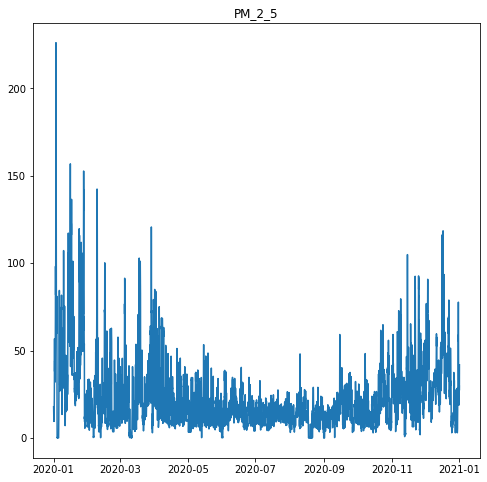

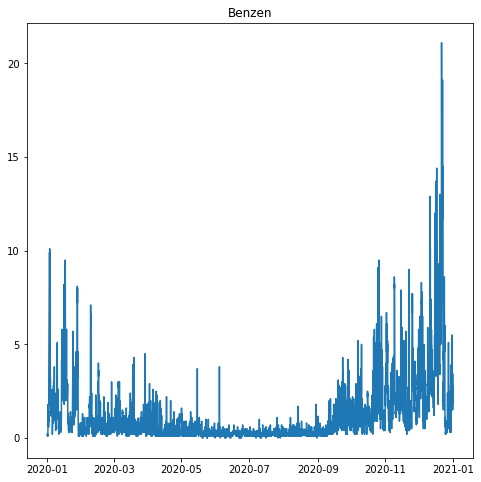

...

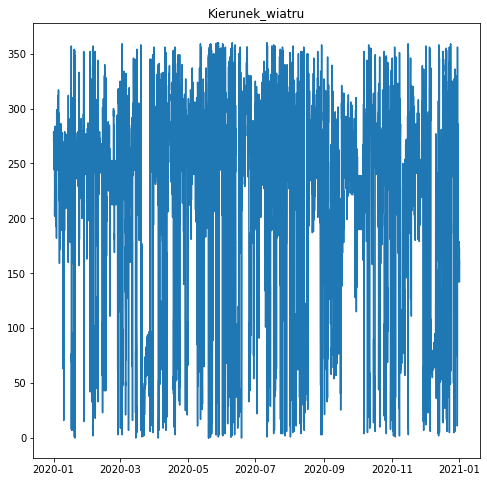

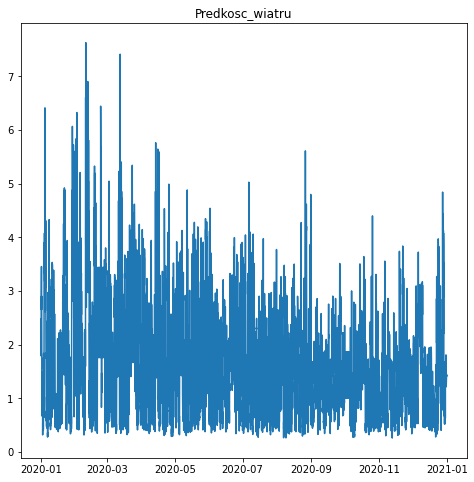

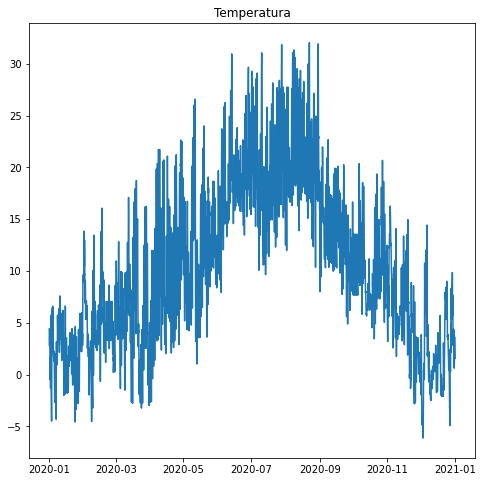

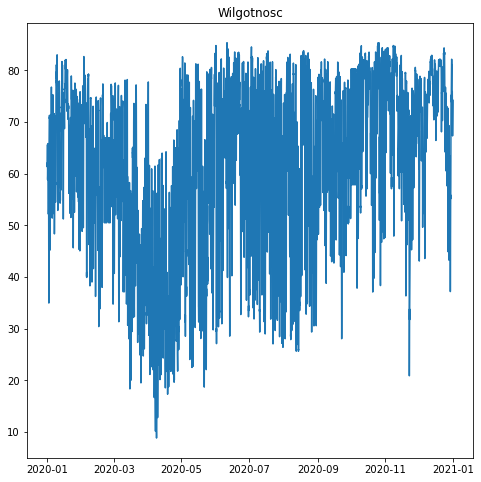

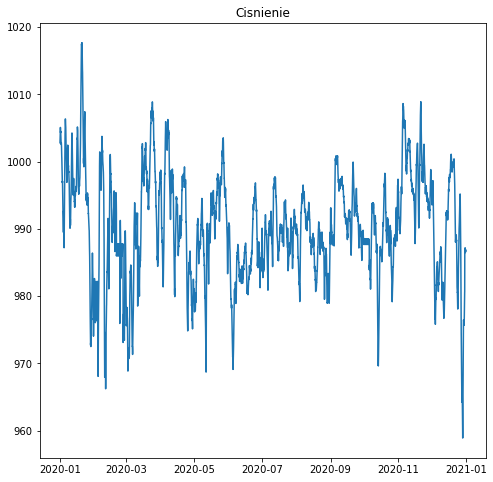

In [34]:
for column in smog.columns:
    if column != 'Data':
        plt.figure(figsize=(8, 8))
        plt.title(column)
        plt.plot(smog['Data'], smog[column])

In [35]:
smog_full= smog.dropna()

In [36]:
smog_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8771 entries, 0 to 8770
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Data             8771 non-null   datetime64[ns]
 1   Dwutlenek_azotu  8771 non-null   float64       
 2   Tlenki_azotu     8771 non-null   float64       
 3   PM10             8771 non-null   float64       
 4   PM_2_5           8771 non-null   float64       
 5   Benzen           8771 non-null   float64       
 6   Tlenek_wegla     8771 non-null   float64       
 7   Kierunek_wiatru  8771 non-null   float64       
 8   Predkosc_wiatru  8771 non-null   float64       
 9   Temperatura      8771 non-null   float64       
 10  Wilgotnosc       8771 non-null   float64       
 11  Cisnienie        8771 non-null   float64       
dtypes: datetime64[ns](1), float64(11)
memory usage: 890.8 KB


In [37]:
smog_full['Rok'] = pd.DatetimeIndex(smog_full['Data']).year

In [38]:
smog_full['Miesiac'] = pd.DatetimeIndex(smog_full['Data']).month
smog_full['Dzien'] = pd.DatetimeIndex(smog_full['Data']).day
smog_full['Godzina'] = pd.DatetimeIndex(smog_full['Data']).hour

In [39]:
smog_full = smog_full.drop(['Data','Rok'],axis=1)

In [40]:
X = smog_full.pop('PM10')
y = smog_full

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
smog_scaled = scaler.fit_transform(smog_full)

In [42]:
smog_scaled

array([[-1.38199496, -1.07135125, -0.2610933 , ..., -1.59771664,
        -1.67903681, -1.52120494],
       [-1.23461816, -0.98847589, -0.40650064, ..., -1.59771664,
        -1.67903681, -1.37655994],
       [-0.80675003, -0.74569985, -0.34131804, ..., -1.59771664,
        -1.67903681, -1.23191494],
       ...,
       [-0.45019326, -0.59652421,  0.21022704, ...,  1.58955693,
         1.73005726,  1.37169502],
       [-0.35511146, -0.37617327,  0.40577484, ...,  1.58955693,
         1.73005726,  1.51634001],
       [-0.45019326, -0.5233989 ,  0.94227779, ...,  1.58955693,
         1.73005726,  1.66098501]])